In [1]:

import json
import requests
import re
import imageio
from skimage import transform,io,data
from skimage.viewer import ImageViewer
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
import datetime


/Users/Jcallano/opt/anaconda3/envs/carroya/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Viewer requires Qt
  


In [2]:
#some definitions of parameters
apikey='DEMO_KEY'
apiurl='https://api.nasa.gov/mars-photos/api/v1/rovers/curiosity/photos'
apiurlm='https://api.nasa.gov/mars-photos/api/v1/manifests/curiosity'
earthdate='2020-08-07'#aaa-mm-dd
camera='all'
page='1'
sb.set(rc={"figure.figsize": (20, 5)})



In [3]:
response = requests.get(apiurlm, params={'api_key':apikey})


In [4]:
a=json.loads(response.text)
print(type(a))
df=pd.DataFrame(a)
df

<class 'dict'>


,photo_manifest
landing_date,2012-08-06
launch_date,2011-11-26
max_date,2020-08-09
max_sol,2847
name,Curiosity
photos,"[{'sol': 0, 'earth_date': '2012-08-06', 'total..."
status,active
total_photos,437158


In [5]:
b=df['photo_manifest']['photos']
pf=pd.DataFrame(b)
pf['earth_datep']=pd.to_datetime(pf['earth_date'])
c=pf.query('earth_datep>="2020-01-01"')
c.sort_values(by=['earth_datep'])

,sol,earth_date,total_photos,cameras,earth_datep
2362,2632,2020-01-01,1099,"[CHEMCAM, FHAZ, MAHLI, MAST, NAVCAM, RHAZ]",2020-01-01
2363,2633,2020-01-02,458,"[FHAZ, MAHLI, MARDI, MAST, NAVCAM, RHAZ]",2020-01-02
2364,2634,2020-01-03,59,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2020-01-03
2365,2635,2020-01-04,371,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2020-01-04
2366,2636,2020-01-05,197,"[CHEMCAM, FHAZ, MARDI, MAST, NAVCAM, RHAZ]",2020-01-05
...,...,...,...,...,...
2560,2843,2020-08-05,68,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2020-08-05
2561,2844,2020-08-06,12,"[FHAZ, MAST, RHAZ]",2020-08-06
2562,2845,2020-08-07,393,"[FHAZ, MAST, NAVCAM, RHAZ]",2020-08-07
2563,2846,2020-08-08,4,"[FHAZ, RHAZ]",2020-08-08


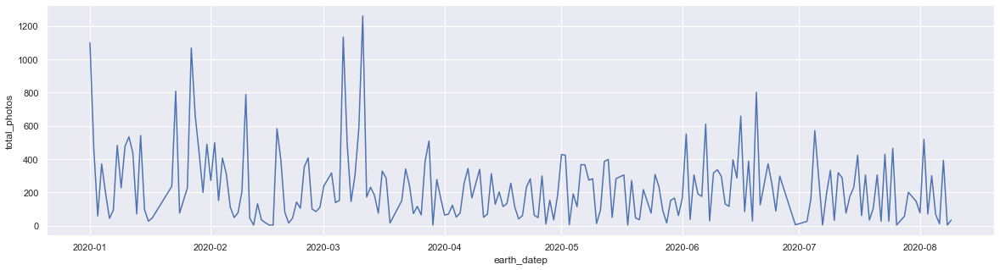

In [6]:
ax = sb.lineplot(x="earth_datep", y="total_photos", 
                  data=c)

In [7]:
earthdate='2020-08-09'
responsep = requests.get(apiurl, params={'earth_date': earthdate,'api_key':apikey})



In [8]:
a=json.loads(responsep.text)
df=pd.DataFrame(a['photos'])
b=df['img_src']

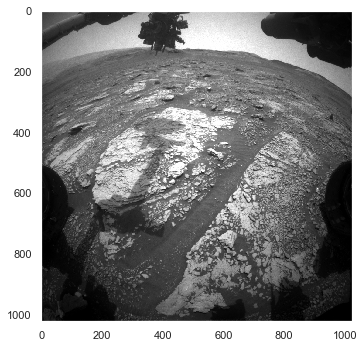

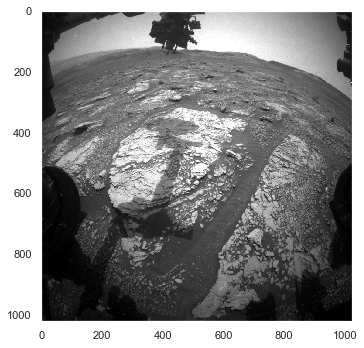

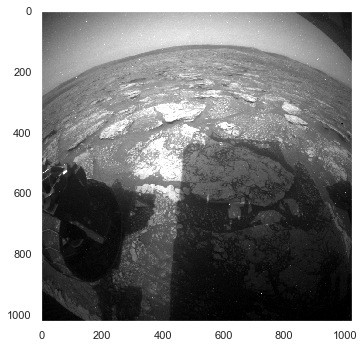

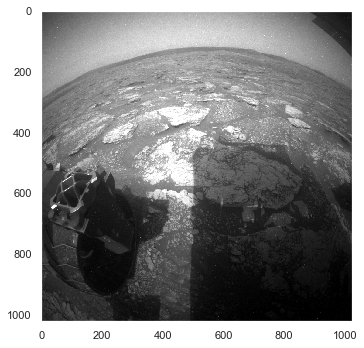

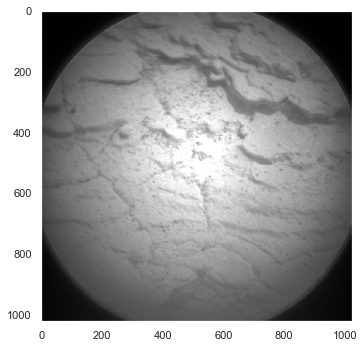

...

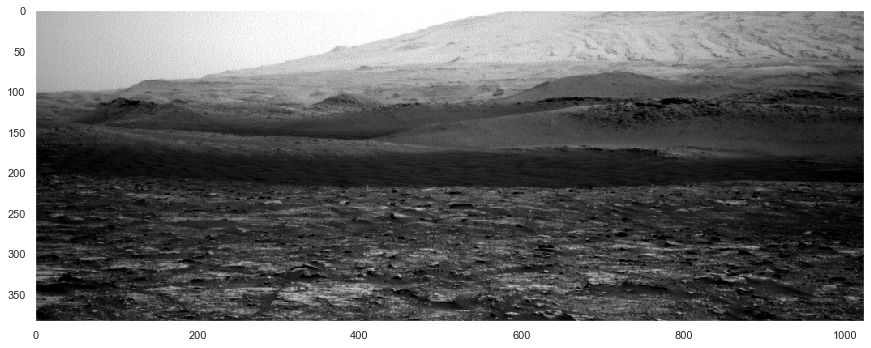

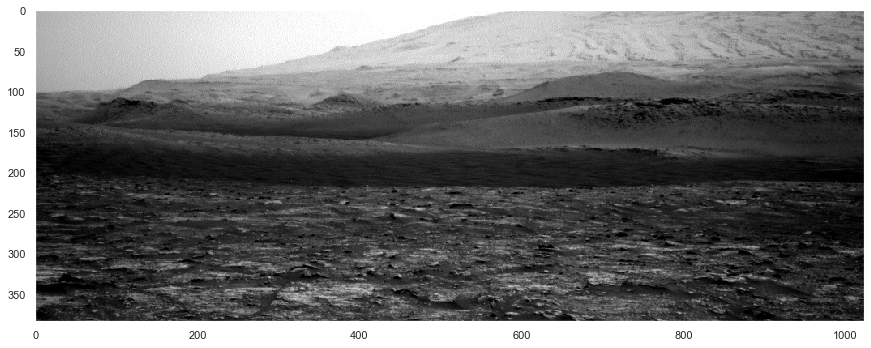

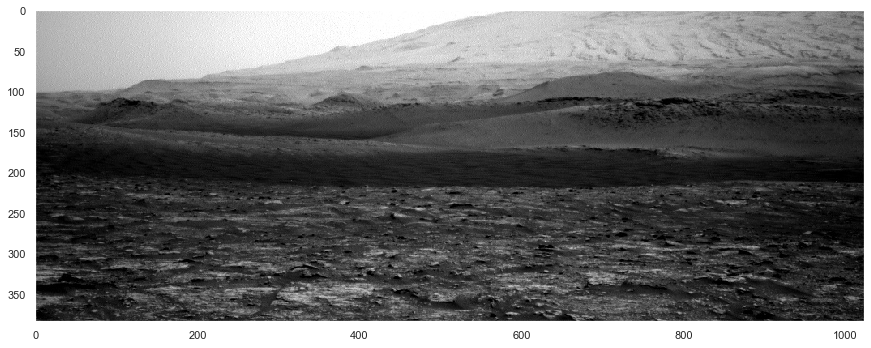

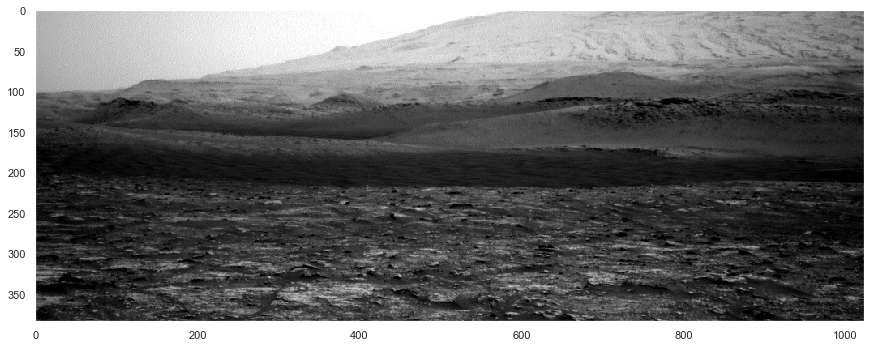

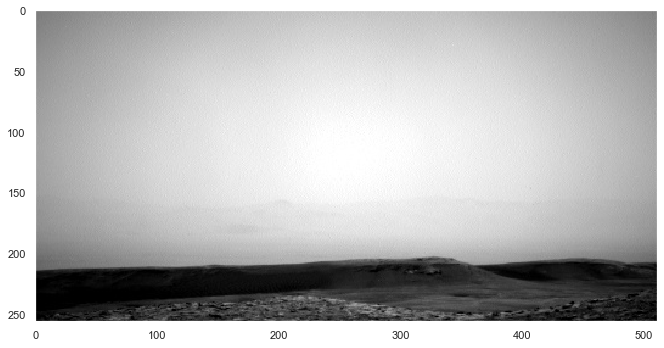

In [9]:
for i in b:
    image = io.imread(i)
    io.imshow(image)
    plt.grid(b=None)
    io.show()

    